In [1]:
from PIL import Image
import numpy as np

In [14]:
IMG_PATH = "./vasik.png"


In [3]:
def convert_to_grayscale(image, average=None):
    """Určení šedého obrazu z barevného obrázku."""
    data = np.array(image)
    r, g, b = data[:, :, 0], data[:, :, 1], data[:, :, 2]


    if not average:
        weights = random_weights()
        gray = (weights[0] * r + weights[1] * g + weights[2] * b).astype(np.uint8)
    else:
        if average == 'simple':
            gray = (r + g + b) // 3
        elif average == 'weighted':
            gray = (0.299 * r + 0.587 * g + 0.114 * b).astype(np.uint8)
        else:
            raise ValueError("average must be 'simple' or 'weighted'")

    return Image.fromarray(gray, mode='L')


def random_weights():
    """Určení náhodných vah pro jednotlivé kanály."""
    random_nums = np.random.rand(3)
    return random_nums / random_nums.sum()


def desaturate(image, s, average='weighted'):
    """Desaturace obrázku podle faktoru s. Pro výpočet šedého obrazu se používá zvolená metoda."""
    data = np.array(image).astype(np.float32)
    r, g, b = data[:, :, 0], data[:, :, 1], data[:, :, 2]
    gray = np.array(convert_to_grayscale(image, average=average)).astype(np.float32)    # kvůli přetečení ve float
    rd = gray + s * (r - gray)
    gd = gray + s * (g - gray)
    bd = gray + s * (b - gray)
    desat_data = np.stack([rd, gd, bd], axis=-1).astype(np.uint8)
    return Image.fromarray(desat_data, mode='RGB')


def normalization(image, target_dist=50):
    """Provede saturační vyrovnání obrázku, aby byl každý barevný pixel ve vzdálenosti target_dist od šedé hodnoty."""
    data = np.array(image).astype(np.float32)
    weights = np.array([0.299, 0.587, 0.114])
    y = np.sum(data * weights, axis=2, keepdims=True)
    vectors = data - y    # vektory od šedé hodnoty
    distance = np.linalg.norm(vectors, axis=-1, keepdims=True)    # Eukleidovská vzdálenost
    mask = distance > 0.001    # pro ne-achromatické pixely
    res = np.copy(data)
    res[mask.squeeze()] = y[mask.squeeze()] + vectors[mask.squeeze()] * (target_dist / distance[mask.squeeze()])

    return Image.fromarray(np.clip(res, 0, 255).astype(np.uint8))


img = Image.open(IMG_PATH)
rgb_img = img.convert("RGB")

(1128, 976, 1)


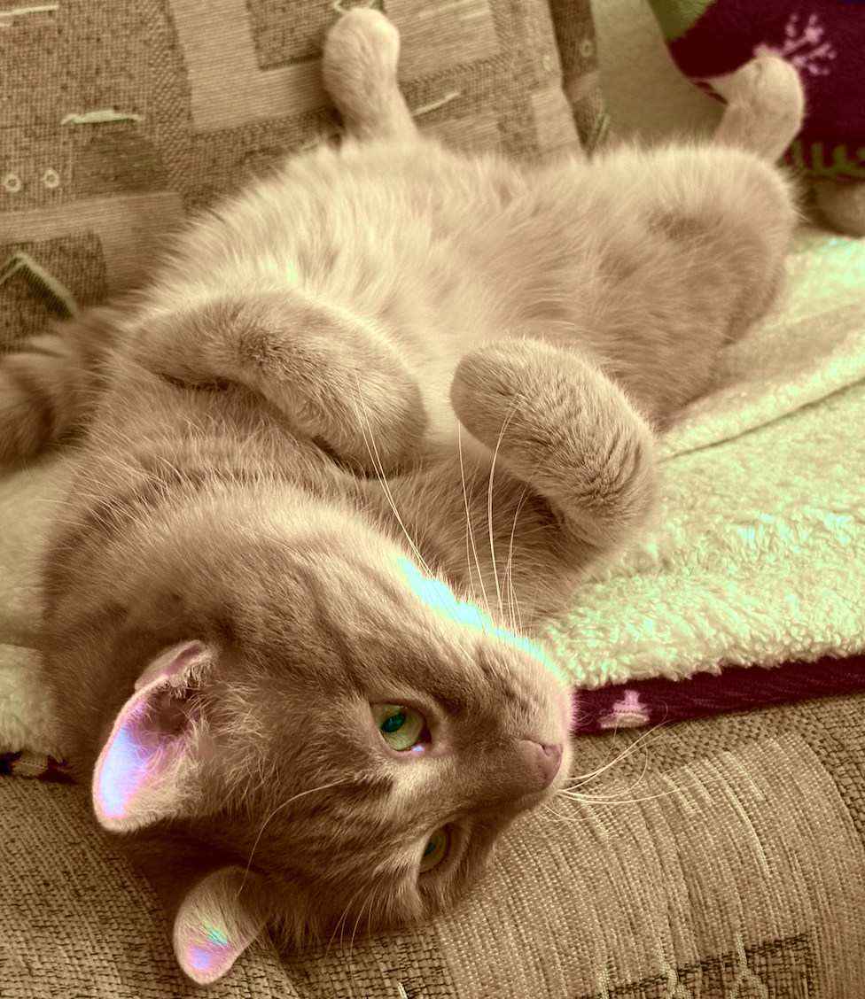

In [36]:
normalization(rgb_img)

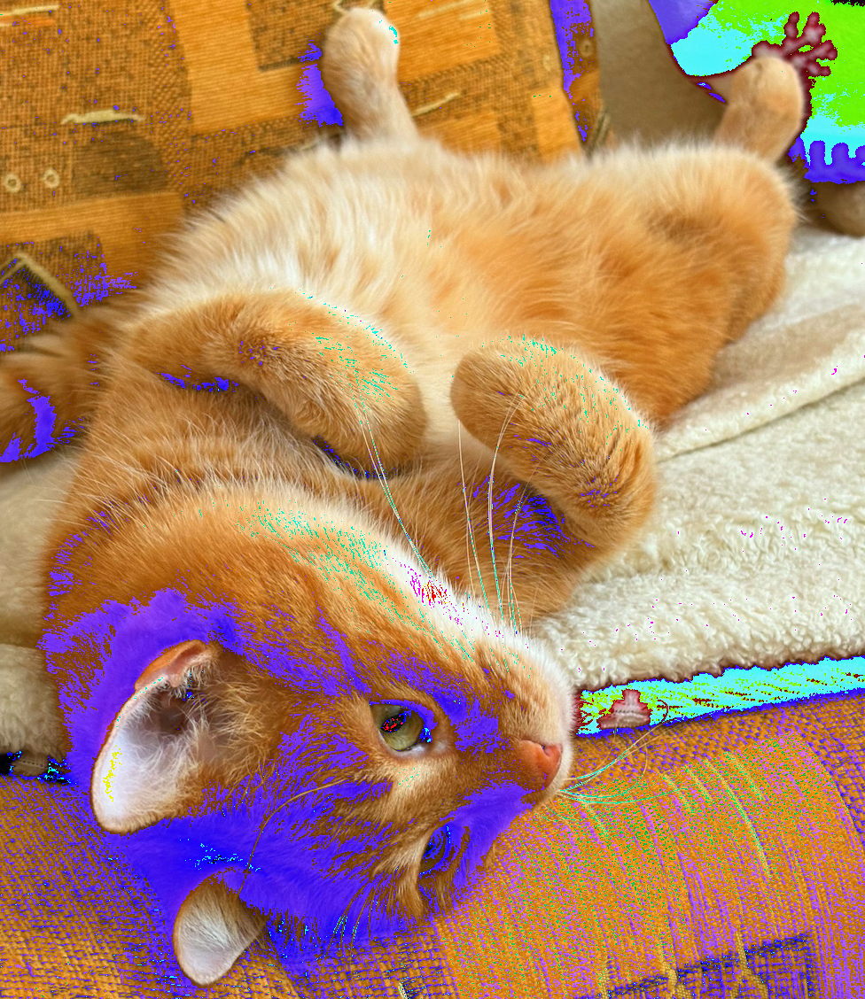

In [30]:
desaturate(rgb_img, s=2, average='weighted')

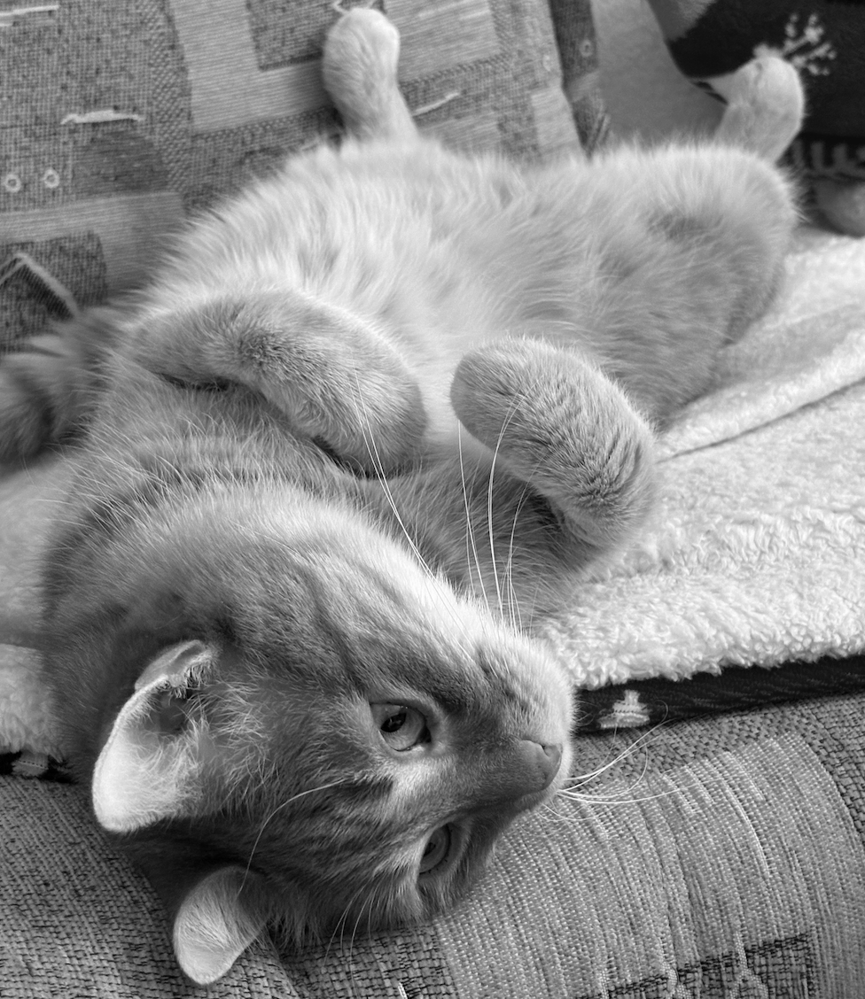

In [ ]:
convert_to_grayscale(rgb_img)

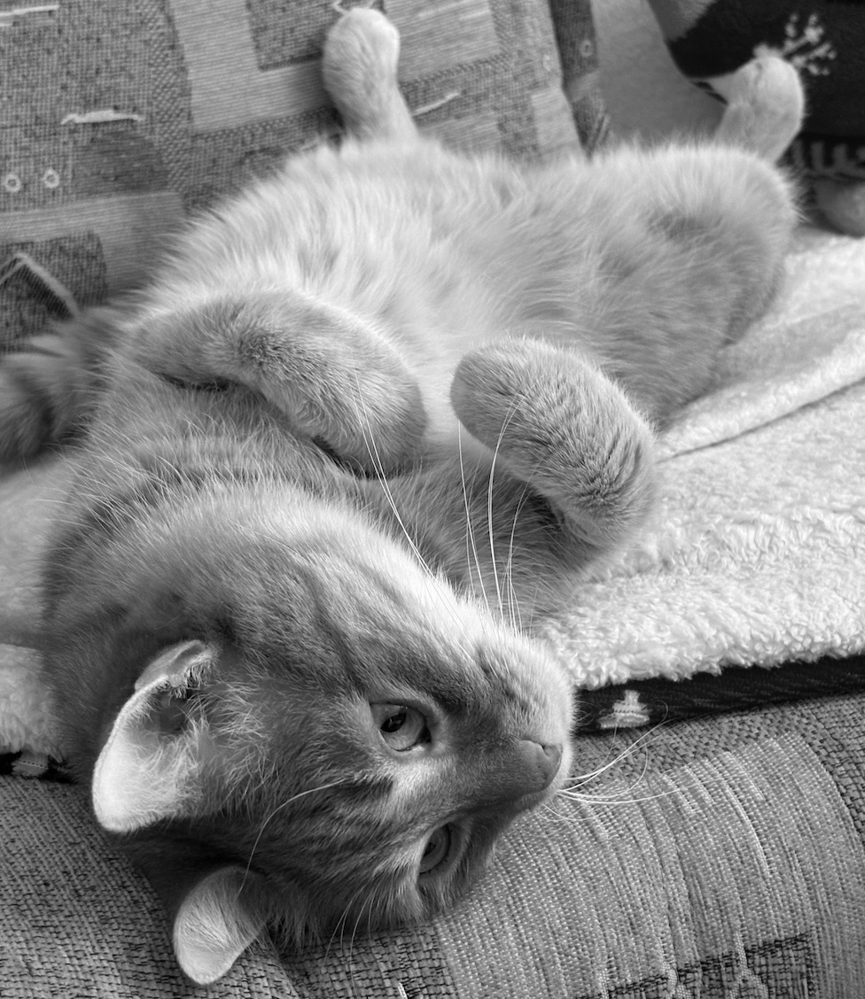

In [18]:
convert_to_grayscale(rgb_img, average='weighted')

In [7]:
data.shape

(1128, 976, 3)

In [4]:
import numpy as np

def matrix_dithering(n):
    if n == 1:
        return np.array([[0]])
    
    n_half = n // 2
    small = matrix_dithering(n_half)

    J = np.ones((n_half, n_half), dtype=int)

    return np.block([
        [4 * small, 4 * small + 2 * J],
        [4 * small + 3 * J, 4 * small + 1 * J]
    ])

def apply_dithering(image, matrix):
    data = convert_to_grayscale(image, average='weighted')
    data = np.array(data)
    n = matrix.shape[0]
    height, width = data.shape
    dithered = np.zeros((height, width), dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            threshold = ((matrix[i % n, j % n] + 0.5) / (n*n))  * 255    # kompenzace prahu pro střední hodnotu
            dithered[i, j] = 255 if data[i, j] >= threshold else 0

    return Image.fromarray(dithered, mode='L')


def apply_dithering_fast(image, matrix):
    data = convert_to_grayscale(image, average='weighted')
    data = np.array(data)
    n = matrix.shape[0]
    height, width = data.shape
    # pokrytí celé velikosti obrazu
    tiled_matrix = np.tile(matrix, (height // n + 1, width // n + 1))
    tiled_matrix = tiled_matrix[:height, :width]
    threshold = ((tiled_matrix + 0.5) / (n*n)) * 255
    dithered = np.where(data >= threshold, 255, 0).astype(np.uint8)

    return Image.fromarray(dithered, mode='L')


In [61]:
grey = convert_to_grayscale(rgb_img, average='weighted')

In [7]:
bla = apply_dithering(rgb_img, matrix_dithering(16))

In [12]:
np.histogram(np.array(bla))

(array([522546,      0,      0,      0,      0,      0,      0,      0,
             0, 578382]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]))

In [26]:
import numpy as np
from PIL import Image

from ukol_1 import convert_to_grayscale

img = Image.open(IMG_PATH)
rgb_img = img.convert("RGB")
gray = convert_to_grayscale(rgb_img, average='weighted')

def brightness(image, c):
    """Úprava jasu obrázku přičtením konstanty c."""
    data = np.array(image).astype(np.int16)
    data += c
    data = np.clip(data, 0, 255).astype(np.uint8)    # zabránění přetečení
    return Image.fromarray(data, mode='L')

def constrast(image, factor: float):
    """Úprava kontrastu obrázku podle zadaného faktoru."""
    data = np.array(image).astype(np.int16)
    data = 128 + factor * (data - 128)    # úprava vzhledem ke středu
    data = np.clip(data, 0, 255).astype(np.uint8)    # zabránění přetečení
    return Image.fromarray(data, mode='L')

def thresholding(image, t: int):
    """Prahování obrázku podle zadané prahové hodnoty t."""
    data = np.array(image).astype(np.uint8)
    data = np.where(data >= t, 255, 0).astype(np.uint8)
    return Image.fromarray(data, mode='L')

def gamma_correction(image, gamma: float):
    """Gamma korekce obrázku podle zadaného gamma faktoru."""
    data = np.array(image).astype(np.float32) / 255.0    # normalizace, abych nepracoval s extrémním exponentem
    data = np.power(data, gamma) * 255.0    # zpětná denormalizace
    data = np.clip(data, 0, 255).astype(np.uint8)
    return Image.fromarray(data, mode='L')


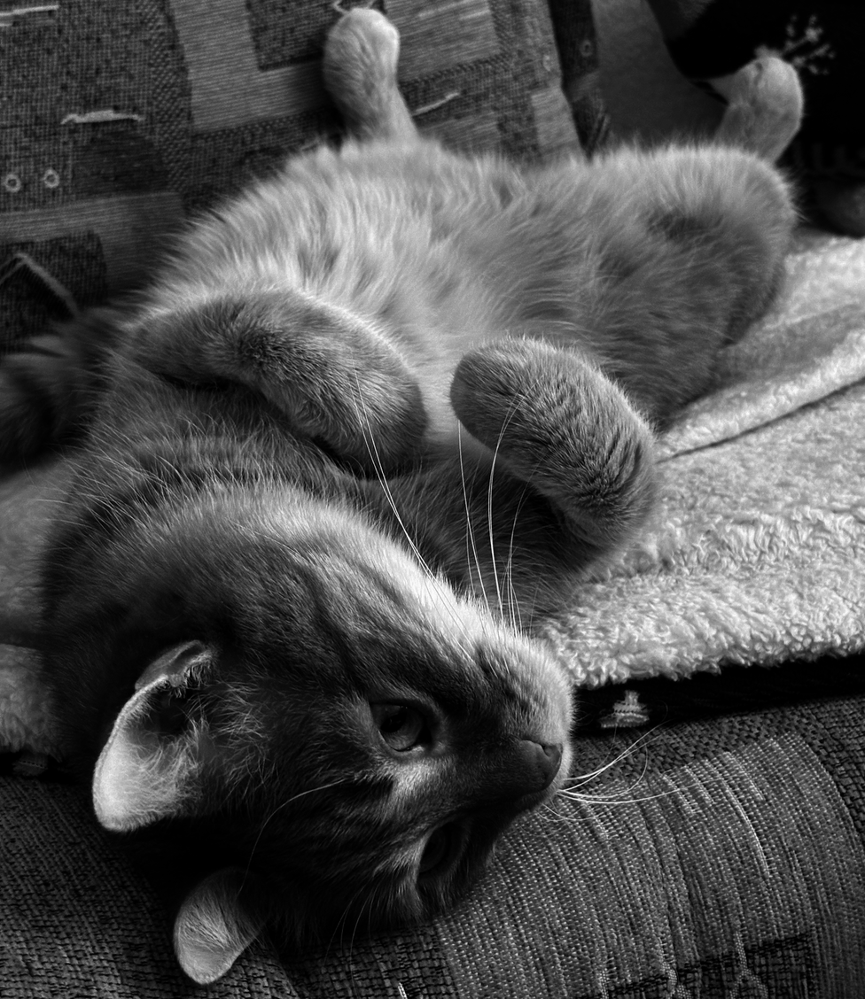

In [28]:
gamma_correction(gray, 2.2)

In [31]:
def histogram(image):
    """Vypočítá histogram jasu obrázku."""
    data = np.array(image).astype(np.uint8)
    height, width = data.shape
    hist = np.zeros(256, dtype=int)
    for i in range(height):
        for j in range(width):
            hist[data[i, j]] += 1
    return hist


def cumulative_histogram(image):
    """Vypočítá kumulativní histogram jasu obrázku."""
    hist = histogram(image)
    cum_hist = np.cumsum(hist)
    return cum_hist


def norm_histogram(image):
    """Vypočítá normalizovaný histogram jasu obrázku."""
    hist = histogram(image)
    total_pixels = np.sum(hist)
    norm_hist = hist / total_pixels    # viz přednáška M*N ... dostanu počet pixelů obrazu
    return norm_hist


def norm_cumulative_histogram(image):
    """Vypočítá normalizovaný kumulativní histogram jasu obrázku."""
    norm_hist = norm_histogram(image)
    norm_cum_hist = np.cumsum(norm_hist)
    return norm_cum_hist


def equalization(image):
    """Provede ekvalizaci jasu obrázku."""
    data = np.array(image).astype(np.uint8)
    height, width = data.shape
    norm_cum_hist = norm_cumulative_histogram(image)
    equalized_data = np.zeros((height, width), dtype=np.uint8)
    L = 256

    for i in range(height):
        for j in range(width):
            equalized_data[i, j] = int(norm_cum_hist[data[i, j]] * (L - 1))

    return Image.fromarray(equalized_data, mode='L')

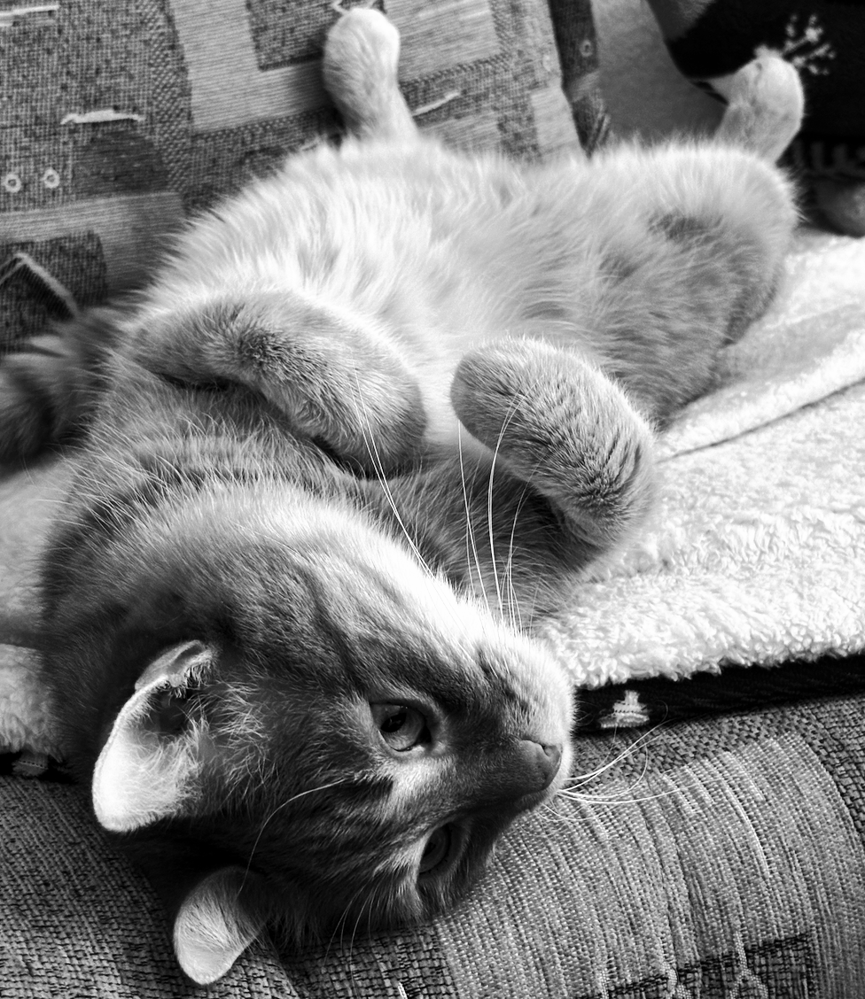

In [32]:
equalization(gray)

In [40]:
kaja = Image.open("kaja.png").convert("RGB")

In [41]:
kaja = convert_to_grayscale(kaja, average='weighted')

In [42]:
def linear_combination(image1, image2, alpha: float):
    """Lineární kombinace dvou obrázků podle váhy alpha."""
    data1 = np.array(image1).astype(np.float32)
    data2 = np.array(image2).astype(np.float32)

    if data1.shape != data2.shape:
        raise ValueError("Obrázky musí mít stejnou velikost a počet kanálů pro lineární kombinaci.")

    combined_data = alpha * data1 + (1 - alpha) * data2
    combined_data = np.clip(combined_data, 0, 255).astype(np.uint8)

    if len(combined_data.shape) == 2:
        mode = 'L'
    else:
        mode = 'RGB'

    return Image.fromarray(combined_data, mode=mode)

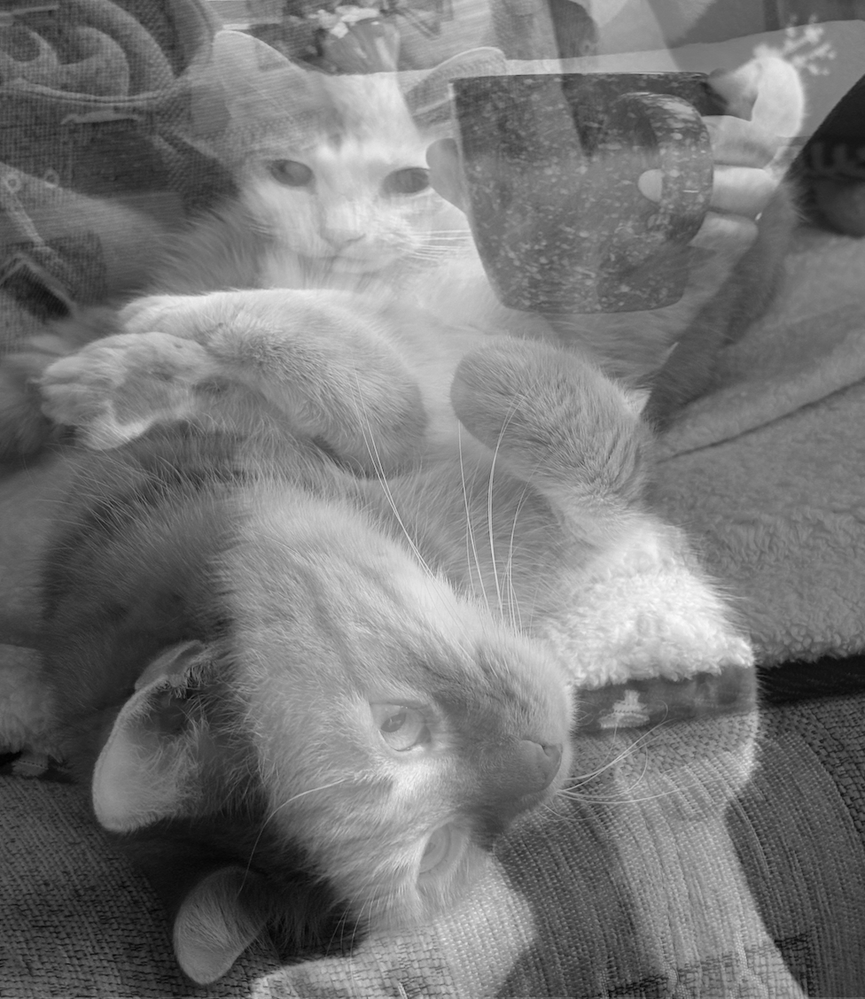

In [45]:
linear_combination(gray, kaja, 0.5)

In [53]:
def bresenham_circle(x0, y0, radius):
    points = []

    def append_points(x, y):
        """Přidá body pro všechny oktanty."""
        points.append((x0 + x, y0 + y))
        points.append((x0 - x, y0 + y))
        points.append((x0 + x, y0 - y))
        points.append((x0 - x, y0 - y))
        points.append((x0 + y, y0 + x))
        points.append((x0 - y, y0 + x))
        points.append((x0 + y, y0 - x))
        points.append((x0 - y, y0 - x))

    x = 0
    y = radius
    midpoint = (x + 1)**2 + (y - 0.5)**2 - radius**2
    append_points(x, y)
    while x <= y:
        x += 1
        if midpoint <= 0:
            midpoint = midpoint + 2 * x + 3
            y = y
        else:
            midpoint = midpoint + 2 * x + 3 - (2 * y - 2)
            y -= 1
        append_points(x, y)
    return set(points)

def draw_circle_on_image(h, w, points):
    """Nakreslí kružnici na obrázek pomocí Bresenhamova algoritmu."""
    data = np.zeros((h, w)).astype(np.uint8)

    for (x, y) in points:
        if 0 <= x < w and 0 <= y < h:
            data[y, x] = 255

    return Image.fromarray(data, mode='L')

In [58]:
points = bresenham_circle(500, 500, 300)

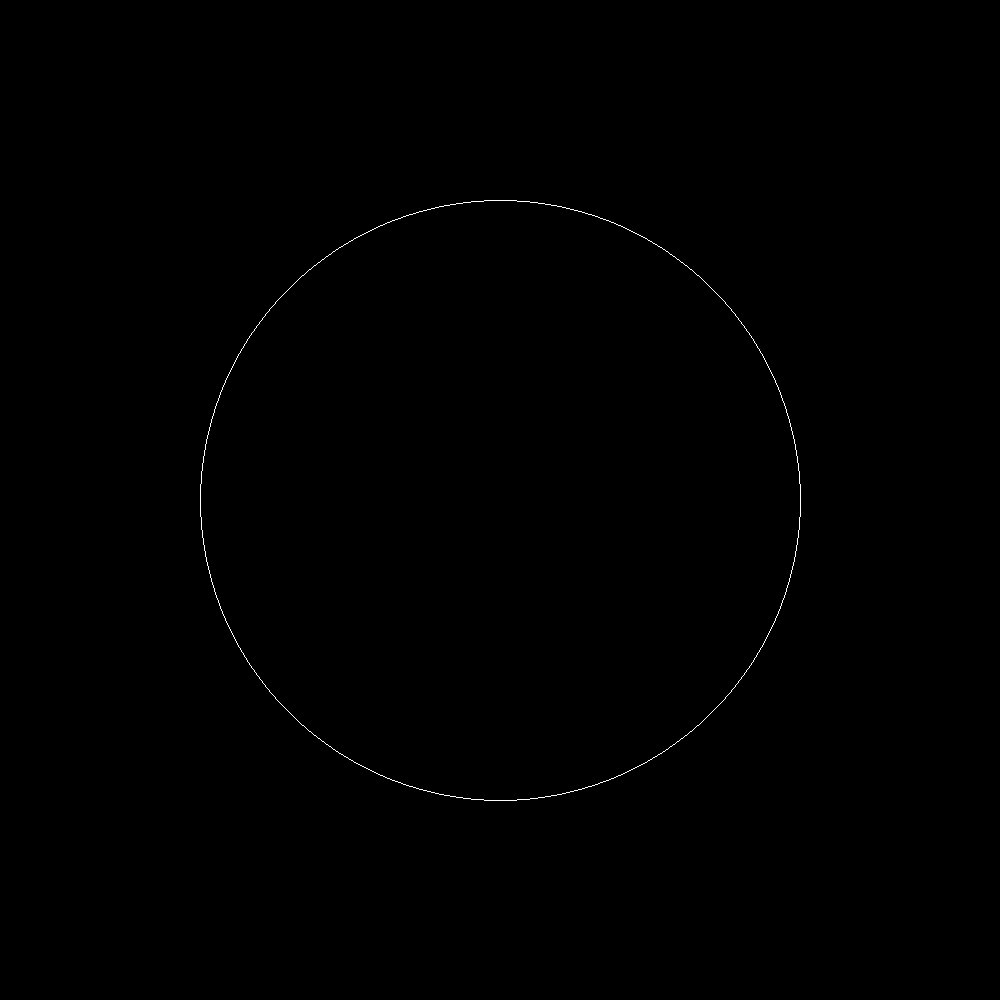

In [59]:
draw_circle_on_image(1000, 1000, points)

In [2]:
import numpy as np

def de_casteljau(control_points: list[list[float]], t: float) -> list[float]:
    """Vypočítá bod na Bézierově křivce pro parametr t."""

    points = np.array(control_points, dtype=float)
    
    for i in range(1, len(points)):
        for j in range(len(points) - i):
            points[j] = (1 - t) * points[j] + t * points[j+1]    # interpolace mezi body

    return points[0].tolist()

# Příklad použití pro kubickou křivku (4 body)
pts = [[0, 0], [10, 50], [90, 50], [100, 0]]
point_at_half = de_casteljau(pts, 0.5)
print(f"Bod v polovině křivky: {point_at_half}")

Bod v polovině křivky: [50.0, 37.5]


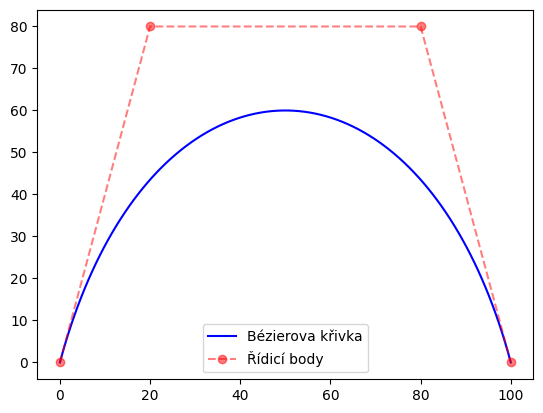

In [ ]:
import matplotlib.pyplot as plt

def draw_bezier(control_points, num_segments=100):
    t_values = np.linspace(0, 1, num_segments)
    curve_points = np.array([de_casteljau(control_points, t) for t in t_values])

    plt.plot(curve_points[:, 0], curve_points[:, 1], 'b-', label='Bézierova křivka')

    cp = np.array(control_points)
    plt.plot(cp[:, 0], cp[:, 1], 'ro--', alpha=0.5, label='Řídicí body')
    
    plt.legend()
    plt.show()

control_pts = [[0, 0], [20, 80], [80, 80], [100, 0]]
draw_bezier(control_pts)